# Node and Edge Embeddings - Using GNN

In [4]:
import pickle
import torch
import networkx as nx
import torch.nn as nn
import matplotlib.pyplot as plt
from functions import AMLDataPreprocessing
import torch
import torch.nn as nn
from torch_geometric.nn import MessagePassing

![Screenshot 2024-05-23 at 21.28.02.png](<attachment:Screenshot 2024-05-23 at 21.28.02.png>)
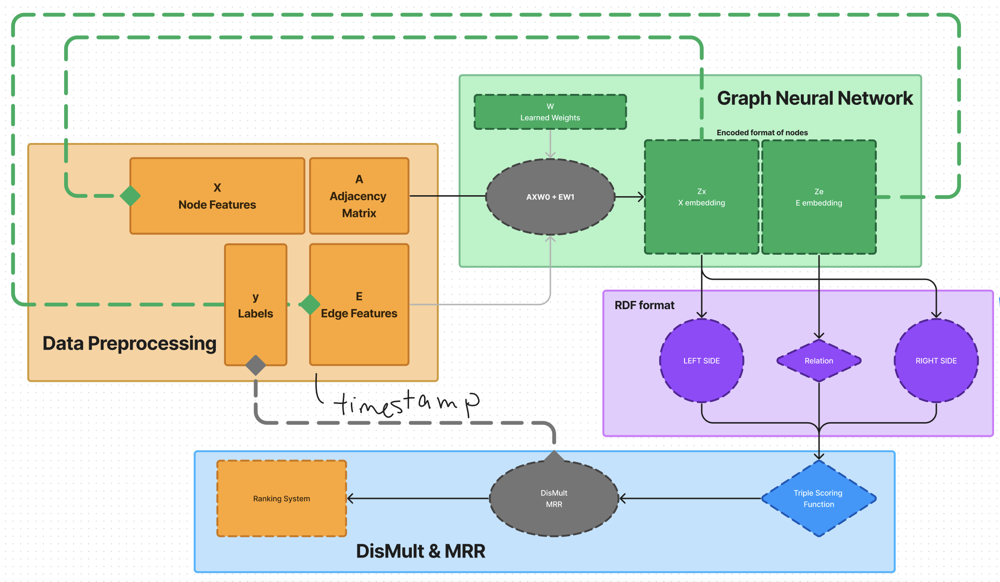

# LOADING GRAPH from Jupyter Notebook 
\(only use if not using Class Preprocessor)

Data Head - <bound method NDFrame.head of              Timestamp  From Bank    Account  To Bank  Account.1  \
0     2022/09/01 00:20         10  8000EBD30       10  8000EBD30   
1     2022/09/01 00:20       3208  8000F4580        1  8000F5340   
2     2022/09/01 00:00       3209  8000F4670     3209  8000F4670   
3     2022/09/01 00:02         12  8000F5030       12  8000F5030   
4     2022/09/01 00:06         10  8000F5200       10  8000F5200   
...                ...        ...        ...      ...        ...   
4994  2022/09/01 00:15      11318  80087D580    11318  80087D580   
4995  2022/09/01 00:02       1674  80087D1B0     1674  80087D1B0   
4996  2022/09/01 00:19        220  80087EA60      220  80087EA60   
4997  2022/09/01 00:19       2843  8008789D0     2843  8008789D0   
4998  2022/09/01 00:29       1674  80087AC10     1674  80087AC10   

      Amount Received Receiving Currency  Amount Paid Payment Currency  \
0             3697.34          US Dollar      3697.34        US Dol

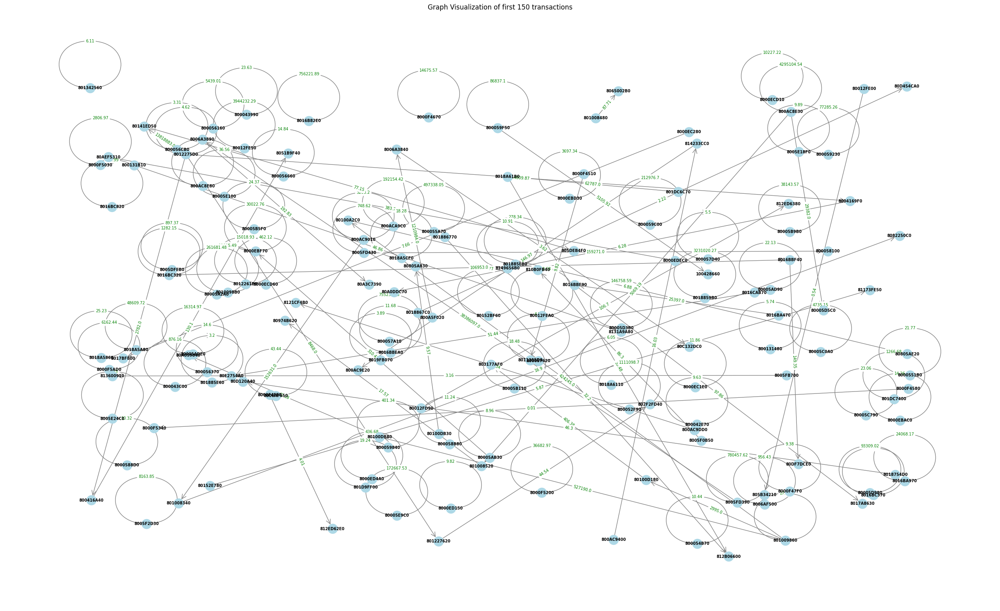

In [5]:
filename = '/Users/owhy/Documents/Datasets/HI-Small_Trans_3.csv'
# Create an instance of the AMLDataPreprocessing class
data_preprocessor = AMLDataPreprocessing(filename)
# Process the data
input_data, graph_full, x, y, labels, links, edges_amount, node_features, edges_features = data_preprocessor.process_data()
# Visualize
visual = data_preprocessor.visualize_graph(links, edges_amount)

adjacency_matrix = torch.from_numpy(nx.adjacency_matrix(graph_full).todense()).to(torch.float)

# PROCESS DATA directly

## Save the data

In [6]:
with open("graph.pickle", "wb") as f:
    pickle.dump({
        'edges_features': edges_features,
        'links': links,
        'labels': labels,
        'graph_full': graph_full,
        'adjacency_matrix': adjacency_matrix,
        'visual': visual,
        'node_features': node_features,
        'x': x,
        'y': y,
        'labels': labels,
        'input_data': input_data
    }, f)


In [7]:
input_data.edge_attr.size()

torch.Size([4999, 26])

In [8]:
labels.size()

torch.Size([4999])

# GRAPH NEURAL NETWORKS

In [54]:
class GNNLayer(MessagePassing):
    def __init__(self, node_features, edge_features, out_channels):
        super(GNNLayer, self).__init__(aggr='add')
        
        self.node_features = node_features
        self.edge_features = edge_features
        self.out_channels = out_channels
        
        # Learnable parameters
        self.weight_node = nn.Parameter(torch.Tensor(node_features, out_channels))
        self.weight_edge = nn.Parameter(torch.Tensor(edge_features, out_channels))
        
        self.reset_parameters()
        
    def reset_parameters(self):
        nn.init.xavier_uniform_(self.weight_node)
        nn.init.xavier_uniform_(self.weight_edge)
        
    def forward(self, x, edge_index, edge_attr):
        # AXW0 + EW1
        global adjacency_matrix
        self.adjacency_matrix = adjacency_matrix
        # adj_matrix = torch.zeros((x.size(0), x.size(0)), device=x.device)
        # adj_matrix[edge_index[0], edge_index[1]] = 1  # Assuming edge_index is of shape (2, num_edges)

        axw = torch.matmul(self.adjacency_matrix, x) @ self.weight_node
        ew = torch.matmul(edge_attr, self.weight_edge)

        # print("-----------------")
        # print(x.size())
        # print(self.adjacency_matrix.size())
        # print(self.weight_node.size())
        # print(edge_attr.size())
        # print(self.weight_edge.size())
        
        # print(axw.size())
        # print(ew.size())

        return axw, ew

    def update(self, aggr_out):
        return aggr_out
    
class GNNModel(nn.Module):
    def __init__(self, node_features, edge_features, out_channels):
        super(GNNModel, self).__init__()

        self.conv1 = GNNLayer(node_features, edge_features, out_channels)
    
    def forward(self, x, edge_index, edge_attr):
        # Two GNN layers with ReLU activation in between.
        axw1, ew1 = self.conv1(x, edge_index, edge_attr)
        # edge_attr = self.update_edge_attr(edge_attr, self.conv1.out_channels)
        print("node embedding:")
        print(axw1)
        print(type(axw1))
        print(axw1.size())
    
        print("edge embedding:")
        print(ew1)
        print(type(ew1))
        print(ew1.size())
        # print(edge_attr)
        # print(type(edge_attr))
        # print(edge_attr.size())
        print("edge_index:")
        print(edge_index.size())
        print(edge_index[0]) # FROM
        print(edge_index[1]) # TO

        heads = []
        tails = []
        relations = []

        head_indices = []
        tail_indices = []

        scores = []

        # Prepare data for training
        for c in range(ew1.size()[0]): # getting all indices
            print(edge_index[0][c])
            print(edge_index[1][c])
            head_index = edge_index[0][c]
            tail_index = edge_index[1][c]

            head_indices.append(head_index)
            tail_indices.append(tail_index)

        for i in range(ew1.size()[0]): # going through all triples
            print(head_indices[i])
            print(tail_indices[i])

            head = axw1[head_indices[i]]
            tail = axw1[tail_indices[i]]
            relation = ew1[i]

            print("head")
            print(head)
            print("tail")
            print(tail)
            print("relation")
            print(relation)

            heads.append(head)
            tails.append(tail)
            relations.append(relation)

            score = self.dismult(head, relation, tail)

        print(heads[0])
        print(tails[0])
        print(relations[0])

        print(len(heads))
        print(len(tails))
        print(len(relations))

        scores.append(score) # calc scores

        # # Stack the tensors for batch processing
        # heads = torch.tensor(heads, dtype=torch.float32, requires_grad=True)
        # relations = torch.tensor(relations, dtype=torch.float32, requires_grad=True)
        # tails = torch.tensor(tails, dtype=torch.float32, requires_grad=True)

        # print(heads.size())
        # print(tails.size())
        # print(relations.size())
        
        return axw1, ew1, scores # returning x and e embeddings

    def update_edge_attr(self, edge_attr, new_channels):
        # Update edge attributes to have 'new_channels'
        # Assuming edge_attr is a tensor of shape (num_edges, num_edge_features)
        num_edge_features = edge_attr.size(1)
        
        if new_channels > num_edge_features:
            # Pad with zeros to match new_channels
            updated_edge_attr = torch.cat((edge_attr, torch.zeros((edge_attr.size(0), new_channels - num_edge_features), device=edge_attr.device)), dim=1)
        else:
            # Keep only the first new_channels channels
            updated_edge_attr = edge_attr[:, :new_channels]
        
        return updated_edge_attr
    
    def dismult(self, head, relation, tail):
        score = torch.sum(head * relation * tail, dim=-1)
        return score

In [55]:
learning_rate = 0.001
out_channels = 15

model = GNNModel(node_features=input_data.x.size(1), edge_features=input_data.edge_attr.size(1), out_channels=out_channels)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.BCEWithLogitsLoss()  # Binary classification loss

def train(data): # using reconstruction loss
    model.train()
    optimizer.zero_grad()
    x_embedding, e_embedding, scores = model(input_data.x, input_data.edge_index, input_data.edge_attr)
    
    # Total loss
    loss = criterion(scores.squeeze(), labels)
    
    loss.backward()
    optimizer.step()
    
    return loss.item(), x_embedding, e_embedding

In [56]:
# Continue training loop from provided script
epochs = 10
losses = []

all_x_embeddings = []
all_e_embeddings = []

for epoch in range(epochs):
    loss, x_embedding, e_embedding = train(input_data)
    losses.append(loss)
    all_x_embeddings.append(x_embedding.detach().cpu().numpy())
    all_e_embeddings.append(e_embedding.detach().cpu().numpy())
    print(f'Epoch {epoch}, Total Loss: {loss}')

node embedding:
tensor([[ 0.5749, -0.0927, -0.5544,  ..., -0.3200,  0.1237,  0.4704],
        [ 1.3740,  1.1477, -0.8481,  ...,  0.4256, -0.6141,  1.0385],
        [ 1.1356,  1.3068, -0.4508,  ..., -0.0295, -0.5700,  1.1251],
        ...,
        [ 0.5857,  0.1825, -0.4093,  ..., -0.2705,  0.0668,  0.8151],
        [ 1.4976, -0.1597, -0.2830,  ..., -0.3828,  0.2262,  0.8804],
        [ 1.2728, -0.1262,  0.0454,  ..., -0.9063, -0.6694,  0.7539]],
       grad_fn=<MmBackward0>)
<class 'torch.Tensor'>
torch.Size([4188, 15])
edge embedding:
tensor([[-14.2588, -17.3436, -29.0852,  ...,  21.2903,   8.3988, -63.7034],
        [-13.1307, -12.4167, -30.3811,  ...,  25.7920,  12.2850, -58.8430],
        [ -3.9340,  -8.1002,  -8.0997,  ...,   2.1174,   0.7127, -19.6871],
        ...,
        [-15.0598, -15.3660, -30.0578,  ...,  21.6530,   9.3781, -59.6870],
        [-12.3069, -14.5019, -28.2953,  ...,  19.9607,  10.6342, -58.9255],
        [-19.1594, -19.0820, -42.1666,  ...,  30.8237,  16.1370, 

NameError: name 'loss_x' is not defined

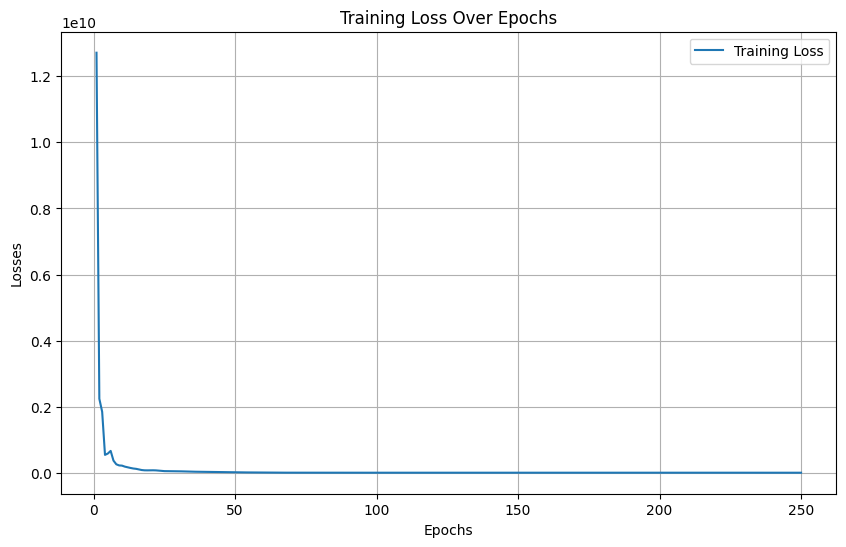

In [8]:
# plot losses
epoch_numbers = list(range(1, epochs + 1))

plt.figure(figsize=(10,6))
plt.plot(epoch_numbers, losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Losses")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()

In [9]:
import gzip
import torch

def save_embeddings_as_triples(edge_index, node_embeddings, edge_embeddings, file_path):
    with gzip.open(file_path, 'wt') as f:
        for i in range(edge_index.size(1)):
            head_index = edge_index[0, i].item()
            tail_index = edge_index[1, i].item()
            head_uri = f"http://example.org/node/{head_index}"
            tail_uri = f"http://example.org/node/{tail_index}"
            relation_uri = f"http://example.org/relation/{i}"

            # Write connectedTo triple
            f.write(f'<{head_uri}> <http://example.org/ontology#connectedTo> <{tail_uri}>\n')
            
            # Write head node embedding triple
            head_embedding = node_embeddings[head_index].numpy()
            head_str = ' '.join(map(str, head_embedding))
            f.write(f'<{head_uri}> <http://example.org/ontology#hasEmbedding> "{head_str}"\n')
            
            # Write tail node embedding triple
            tail_embedding = node_embeddings[tail_index].numpy()
            tail_str = ' '.join(map(str, tail_embedding))
            f.write(f'<{tail_uri}> <http://example.org/ontology#hasEmbedding> "{tail_str}"\n')
            
            # Write edge embedding triple
            relation_embedding = edge_embeddings[i].numpy()
            relation_str = ' '.join(map(str, relation_embedding))
            f.write(f'<{relation_uri}> <http://example.org/ontology#hasEmbedding> "{relation_str}"\n')

# Example usage after training
x_embeddings = torch.tensor(all_x_embeddings[-1])  # Use the last epoch's embeddings
e_embeddings = torch.tensor(all_e_embeddings[-1])  # Use the last epoch's embeddings

save_embeddings_as_triples(input_data.edge_index, x_embeddings, e_embeddings, 'embeddings.nt.gz')


In [10]:
import gzip

def print_rdf_triples(file_path):
    # counter = 0
    with gzip.open(file_path, 'rt') as f:
        counter = 0
        for line in f:
            print(line.strip())
            counter += 1
    print(counter)

# Replace 'embeddings.nt.gz' with the actual file path
print_rdf_triples("embeddings.nt.gz") # CONNECTED TO --> HAS EMBEDDING
# print(4999*4)

<http://example.org/node/0> <http://example.org/ontology#connectedTo> <http://example.org/node/0>
<http://example.org/node/0> <http://example.org/ontology#hasEmbedding> "-0.0041899635 -0.02927397 0.019502103 0.0029795368 0.04887036 0.00087385706 0.06722141 -0.016970158 0.0051050386 0.015823327 -0.012646257 0.01943206 0.011188019 -0.02629507 -0.020596633"
<http://example.org/node/0> <http://example.org/ontology#hasEmbedding> "-0.0041899635 -0.02927397 0.019502103 0.0029795368 0.04887036 0.00087385706 0.06722141 -0.016970158 0.0051050386 0.015823327 -0.012646257 0.01943206 0.011188019 -0.02629507 -0.020596633"
<http://example.org/relation/0> <http://example.org/ontology#hasEmbedding> "-33.369724 -10.805187 36.64892 -12.018215 14.795275 -32.9601 10.405438 33.46307 -38.556625 19.686995 25.487383 9.186537 -29.817432 -27.422358 -22.540808"
<http://example.org/node/1> <http://example.org/ontology#connectedTo> <http://example.org/node/8136>
<http://example.org/node/1> <http://example.org/ontol

In [11]:
def evaluate_reconstruction(x_embeddings, e_embeddings, model, input_data):
    model.eval()
    reconstructed_x = model.decoder_x(torch.tensor(x_embeddings).to(input_data.x.device))
    reconstructed_e = model.decoder_e(torch.tensor(e_embeddings).to(input_data.edge_attr.device))
    
    mse_loss = nn.MSELoss()
    loss_x = mse_loss(reconstructed_x, input_data.x)
    loss_e = mse_loss(reconstructed_e, input_data.edge_attr)
    
    return loss_x.item(), loss_e.item()

loss_x, loss_e = evaluate_reconstruction(all_x_embeddings[-1], all_e_embeddings[-1], model, input_data)
print(f'Reconstruction Loss for Node Features: {loss_x}')
print(f'Reconstruction Loss for Edge Features: {loss_e}')

Reconstruction Loss for Node Features: 49134.58203125
Reconstruction Loss for Edge Features: 4.900155067443848


In [12]:
with open("embeddings.pickle", "wb") as f:
    pickle.dump({
        'x_embeddings': x_embeddings,
        'e_embeddings': e_embeddings
    }, f)